# Capstone Project - The Battle of Neighborhoods in Paris
# Method for determining the best location for a new restaurant

## Table of contents
* [1. Introduction](#introduction)
* [1.1 Background](#background)
* [1.2 Business Problem and interest](#business)
* [2. Data acquisition and cleaning](#data)
* [2.1 Data sources](#datasource)
* [2.2 Data cleaning](#datacleaning)
* [2.3 Feature selection](#feature)
* [3. Methodology](#methodology)
* [3.1 Exploratory Data Analysis, first step](#firststep)
* [3.2 Exploratory Data Analysis, second step](#secondstep)
* [3.3 Exploratory Data Analysis, third step](#thirdstep)
* [4. Results, difficulties, discussion and possible improvements](#results)
* [5. Conclusion](#conclusion)
* [6. References](#references)
* [CODE](#code)

## 1. Introduction  <a name="introduction"></a>

## 1.1 Background <a name="background"></a>

There are currently around 12,000 restaurants in Paris for 2,150 million inhabitants. That is to say, on average, about 1 restaurant per hectare. That's a lot, the competition is tough.
Many restaurants are closing, especially in these times of crisis.
A newcomer might then wonder where to set up his (or her) new restaurant. 
He may then have the choice between :
- finding a place where there are very few restaurants of his specialty in order to attract customers of the local neighborhood who want to change cuisine or, 
- setting up his restaurant where there are already many restaurants of his own specialty because even if there is competition, this means that there is an already existing clientele.

The restaurateur must therefore know what is the distribution of "cuisines" in the different neighborhoods in order to be able to make his choice.

## 1.2 Business problem and interest <a name="business"></a>

The aim of this project is therefore to offer new restaurant owners a global vision of the distribution of restaurants in Paris thanks to a clustering which makes it possible to know for each district which are the most represented cuisines or regions and those less represented, and a transversale view across the different districts.<br>
According to the strategy chosen by the owner, he (or she) will be able to choose in which district to try settling and the right spot in the district.<br>

Therefore, the problem is :
- to find where the restaurants are located and to know their specialty, for example using the Foursquare API [1], and then
- to use machine learning to bring out the general culinary trends and tastes of each neighborhood, for example the unsupervised learning method Clustering
- to visualize the position of the various restaurants in the choosen district, for example with Folium [2].

## 2. Data acquisition and cleaning <a name="data"></a>

## 2.1 Data sources <a name="datasource"></a>

Worldwide venues description can be accessed through the Foursquare API once an account has been created on their site [1] there :
https://developer.foursquare.com/developer/

The different categories of cuisines are referenced on their page of categories [3] : https://developer.foursquare.com/docs/build-with-foursquare/categories/

We can see an example of hierarchy describing the kind of cuisine and their ID: <br>
Food<br>
4d4b7105d754a06374d81259<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Afghan Restaurant<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;503288ae91d4c4b30a586d67<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;African Restaurant<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4bf58dd8d48988d1c8941735<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Ethiopian Restaurant<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4bf58dd8d48988d10a941735

To request Foursquare, we need the category of restaurant and the GPS coordinates of the neighborhoods of Paris.<br>
It's quite difficult to find accurate GPS coordinates... Each site gives different coordinates... So, for the center of Paris, needed to center the Folium map, I chose the site <b><i>latitude.to</i></b> [4] that I scraped with the library <b><i>BeautifulSoup</i></b>.<br>
However, for the coordonates of the 20 districts of Paris, I couldn't find correct coordinates on the Web, so I "manually" used <b><i>Google Map</i></b> [5] to approximately determine them.

## 2.2 Data cleaning <a name="datacleaning"></a>

There was another difficulty. Foursquare uses circles to demarcate the areas where it will look for the venues. But the Parisian districts are not round.<br>
So I had to manually draw several circles (from 1 to 3) inside the neighborhoods in order to get as many restaurants as possible, even though Foursquare requests only return 30 venues per category each time. So it may be not exactly accurate, but it's the principle.

I couldn't draw a unique big circle encompassing each district because Foursquare only brings back 30 venues per search research. I would have lost more venues.

As we'll see below, I have entered the centers of the circles and their radius in my local file <b><i>district_coordinates.csv</i></b>.

And I entered the coordinates of the centers of the districts in my local file <b><i>district_centers_coordinates.csv</i></b>.

But for the centers of the districts, I couldn't find correct coordinates on the Web, so I "manually" used Google Map to approximately determine them. 

## 2.3 Feature selection <a name="feature"></a>

- There are about 250 food categories in Foursquare but it was too much because Fousquare limits to 950 requests per day for a free account. So I restricted to 69 categories. Multiplicated by the 46 "circles" in the 20 districts, that makes 3174 requests to Foursquare, i.e. 4 days.<br> 
- I also added a « region » feature to geographically group most of the cuisine categories. Foursquare had already did it, for example Asia, Africa and so on. But as some venues were only to be find in sub-categories or only in regions, I decided to create a feature to group every country of a continent.<br> 
- I just made three exceptions to try to highlight some specificities in Paris. French, Indian and Japanese venues. But they can be respectively regrouped in Europa and Asia. For example, we'll see that Japanese restaurants are often more common (5th region place) than America (6th place).    

## 3. Methodology <a name="methodology"></a>

The goal is to find a place that suits the new restaurateur. As a case study, we will take a person who wants to open an Indian restaurant. He chooses the strategy of finding a place in Paris where Indian restaurants are not very numerous and where there are few other restaurants. The method is suitable for any other strategy, it's just to make a choice.

- The first step is to retrieve the data, GPS coordinates of the districts, list of the
different restaurants with their category and their GPS coordinates.
- The second step makes it possible to analyze the distribution of restaurant
categories in the different districts in a vertical way, district by district, then
transversally across the districts thanks to a clustering in order to highlight the
major trends in distribution by grouping them together. For example a cluster
where Asian restaurants are the majority, a cluster where French restaurants
lead, another where fast food is preferred, etc. These two steps allow the new
owner to determine in which district he will try to set up his restaurant.
- The third step studies the distribution of restaurants in choosen district by
visualizing where the groups of restaurants are located, the areas where there
are few or no restaurants, and where the already present Indian restaurants are.
The restaurateur will thus have a precise idea of the location where he could set
up his restaurant.

If he chose to compete with other Indian restaurants in the districts where they are most represented, the proposed method also makes it possible to do so.

## 3.1 Exploratory Data Analysis, first step <a name="firststep"></a>

### Import of the librairies and useful data

In [18]:
import warnings
warnings.filterwarnings('ignore')

#!pip install folium
import folium # map rendering library

from math import pi,sqrt,sin,cos,atan2
from urllib.request import urlopen
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import requests # library to handle requests 
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns

CLIENT_ID = '' # your Foursquare ID (I removed mine for public display)
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
count_requests = 0
degree_to_rad = float(pi / 180.0)

%matplotlib inline

### Picking up Paris center coordinates with BeautifulSoup and Google Map ! 

In [19]:
Paris_center_soup = BeautifulSoup(urlopen("https://latitude.to/map/fr/france/cities/paris"), 'html.parser')
Paris_center = Paris_center_soup.find("input", {"id": "DD"}).get('value').split(' ')
Paris_center

['48.85341', '2.3488']

### Picking up districts center coordinates

As the coordinates of the districts of Paris are never accurate on the websites, I "googled map" them and put them in the file 'district_centers_coordinates.csv'. I also added the width of the districts.  

In [20]:
df_center_arrd_coordinates = pd.read_csv(r'H:\COURSERA_DS\course9_Capstone\week4\district_centers_coordinates.csv')
df_center_arrd_coordinates.head()

,Arrd,Arrd_lat,Arrd_lng,Width
0,1,48.862994,2.335592,2.12
1,2,48.868651,2.342876,1.93
2,3,48.863132,2.359781,1.82
3,4,48.854801,2.358448,2.05
4,5,48.844402,2.350722,2.16


As the districts of Paris are not round, I tried to make connected circles that fill the districts. So there can be one to three requests per district.

In [21]:
df_arrd_coordinates = pd.read_csv(r'H:\COURSERA_DS\course9_Capstone\week4\district_coordinates.csv')
df_arrd_coordinates.head()

,Arrd,Arrd_lat,Arrd_lng,rad
0,1,48.865789,2.327739,500
1,1,48.863079,2.336408,500
2,1,48.861244,2.345377,500
3,2,48.869364,2.333671,150
4,2,48.868489,2.341267,300


### Collecting Foursquare venues categories 

- The categories of worldwide cuisine can be found on the site : https://developer.foursquare.com/docs/build-with-foursquare/categories
- We can find different levels, countries (ex. Morrocan), continents (ex. Africa), general kind of food (ex. fast food).
- I grouped the cuisines by region, except for France, Japon and India.
- I had to make choices of categories because with 20 districts and 250 categories, i.e. 5000 requests at Foursquare and 950 allowed requests a day, it would have taken too much time. I only kept 69 categories and 8 regions.  

In [22]:
df_categories = pd.read_csv(r'H:\COURSERA_DS\course9_Capstone\week4\categories.csv')
df_categories.head()

,Category_region,Category_id,Cuisine
0,Africa,4bf58dd8d48988d1c8941735,African
1,Africa,4bf58dd8d48988d10a941735,Ethiopan
2,Africa,4bf58dd8d48988d1c3941735,Morrocan
3,America,4bf58dd8d48988d14e941735,American
4,America,4bf58dd8d48988d157941735,NewAmerican


### Collecting all the venues of the 20 districts

#### As I couldn't make all the requests in one time, I made them by district and saved them locally in order to retrieve them at the end for the clustering.  

In [115]:
df_all_venues_20 = get_all_venues_by_district(df_arrd_coordinates, df_categories, 20)

Saving locally. I only display one example for more visibility.

In [27]:
df_all_venues_20.to_csv(r'H:\COURSERA_DS\course9_Capstone\week4\df_all_venues_20.csv', index=False)

Here, I'm concatenating all the data

In [23]:
df_all_venues = pd.DataFrame(columns=['Arrd', 'Arrd_lat', 'Arrd_lng', 'Venue', 'Venue lat', 'Venue lng', 'Category region', 'Cuisine'])
for i in np.arange(1,21):
    file_name = 'H:\COURSERA_DS\course9_Capstone\week4\df_all_venues_'+str(i)+'.csv'
    df_all_venues_n = pd.read_csv(file_name)
    df_all_venues = df_all_venues.append(df_all_venues_n, ignore_index=True)
df_all_venues

,Arrd,Arrd_lat,Arrd_lng,Venue,Venue lat,Venue lng,Category region,Cuisine
0,1,48.865789,2.327739,Charly Bun's,48.867215,2.332305,America,American
1,1,48.865789,2.327739,Razowski,48.867273,2.332588,America,American
2,1,48.865789,2.327739,Will'n Joy,48.871317,2.325540,America,American
3,1,48.865789,2.327739,Ferona,48.868458,2.324971,America,Argentinian
4,1,48.865789,2.327739,Ferona,48.868458,2.324971,America,SouthAmerican
...,...,...,...,...,...,...,...,...
12268,20,48.855189,2.406624,Gook,48.847705,2.407768,Miscellaneous,FastFood
12269,20,48.855189,2.406624,Vitamin,48.851584,2.399250,Miscellaneous,FastFood
12270,20,48.855189,2.406624,Le Délice D'Avron,48.851358,2.398775,Miscellaneous,FastFood
12271,20,48.855189,2.406624,le marechal,48.857639,2.410185,Miscellaneous,FastFood


## 3.2 Exploratory Data Analysis, second step <a name="secondstep"></a>

#### Venues by cuisine:

In [24]:
df_all_venues.groupby('Cuisine').count()

,Arrd,Arrd_lat,Arrd_lng,Venue,Venue lat,Venue lng,Category region
Cuisine,,,,,,,
African,235,235,235,235,235,235,235
Alsatian,9,9,9,9,9,9,9
American,132,132,132,132,132,132,132
Argentinian,37,37,37,37,37,37,37
Asian,1238,1238,1238,1238,1238,1238,1238
...,...,...,...,...,...,...,...
Tapas,201,201,201,201,201,201,201
Thai,392,392,392,392,392,392,392
Turkish,220,220,220,220,220,220,220


#### Venues by region:

In [25]:
df_all_venues.groupby('Category region').count()

,Arrd,Arrd_lat,Arrd_lng,Venue,Venue lat,Venue lng,Cuisine
Category region,,,,,,,
Africa,449,449,449,449,449,449,449
America,590,590,590,590,590,590,590
Asia,2950,2950,2950,2949,2950,2950,2950
Europa,2211,2211,2211,2211,2211,2211,2211
France,2077,2077,2077,2077,2077,2077,2077
India,345,345,345,345,345,345,345
Japan,1189,1189,1189,1189,1189,1189,1189
Middle east,484,484,484,484,484,484,484
Miscellaneous,1978,1978,1978,1978,1978,1978,1978


Grouping the venues by district and by region

In [26]:
df_hot_region_grouped = grouping_Region_data(df_all_venues)

Grouping the venues by district and by cuisine

In [27]:
df_hot_cuisine_grouped = grouping_cuisine_data(df_all_venues)

Here are the results for the regions. We can see the proportions of region venues for each district. <br>
The sum of the proportions for one district is 1. For example, in the third district, Asia accounts for 0.303797 i.e. 30.38 % of all restaurant venues in this district.  

In [28]:
df_hot_region_grouped

,Arrd,Africa,America,Asia,Europa,France,India,Japan,Middle east,Miscellaneous
0,1,0.017642,0.048282,0.236769,0.193129,0.161560,0.007428,0.100279,0.030641,0.204271
1,2,0.025111,0.054653,0.277696,0.132939,0.159527,0.016248,0.091581,0.019202,0.223043
2,3,0.030380,0.048101,0.303797,0.177215,0.184810,0.005063,0.111392,0.017722,0.121519
3,4,0.018229,0.028646,0.242188,0.205729,0.255208,0.010417,0.127604,0.010417,0.101562
4,5,0.031008,0.043411,0.243411,0.184496,0.200000,0.040310,0.080620,0.051163,0.125581
5,6,0.012170,0.056795,0.231237,0.190669,0.255578,0.020284,0.097363,0.018256,0.117647
6,7,0.005319,0.034574,0.242021,0.196809,0.281915,0.021277,0.106383,0.010638,0.101064
7,8,0.013497,0.033129,0.239264,0.147239,0.186503,0.022086,0.109202,0.023313,0.225767
8,9,0.032012,0.062500,0.201220,0.227134,0.135671,0.045732,0.082317,0.039634,0.173780
9,10,0.065860,0.067204,0.221774,0.190860,0.112903,0.040323,0.061828,0.086022,0.153226


### Distribution of the 8 main regions over the 20 districts

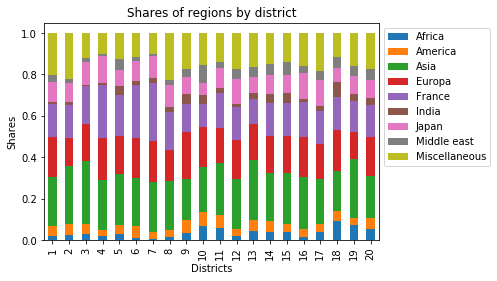

In [29]:
df_hot_region_grouped_wo_Arrd = df_hot_region_grouped.drop('Arrd', axis=1)
df_hot_region_grouped_wo_Arrd.plot.bar(stacked=True)
plt.xticks(list(range(20)), list(range(1, 21)))
plt.xlabel("Districts")
plt.ylabel("Shares")
plt.title("Shares of regions by district")
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)
plt.show()

We can see that the distributions of the regions are fairly homogeneous « along » the districts.

### Distribution of the 10 first cuisines over the 20 districts

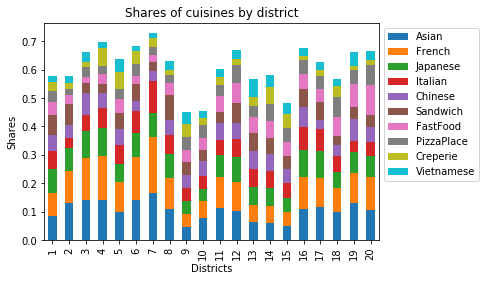

In [30]:
df_hot_cuisine_grouped_wo_Arrd = df_hot_cuisine_grouped.drop('Arrd', axis=1)
list_10_cuisines = list(df_hot_cuisine_grouped.mean().sort_values(ascending=False)[1:11].index)
df_hot_cuisine_grouped_wo_Arrd[list_10_cuisines].plot.bar(stacked=True)
plt.xticks(list(range(20)), list(range(1, 21)))
plt.xlabel("Districts")
plt.ylabel("Shares")
plt.title("Shares of cuisines by district")
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)
plt.show()

Here, we can observe that the 10 first categories account for between 40 and 70% of the food venues in the districts. « Fast » restaurants (fast food, pizzas, sandwiches) and takeaways, caterers are omnipresent.

#### 5 top venues by region and districts

In [31]:
displayTopVenuesInNeighborhood(5, df_hot_region_grouped, 3)

----1----
           venue  freq
0           Asia  0.24
1  Miscellaneous  0.20
2         Europa  0.19
3         France  0.16
4          Japan  0.10


----2----
           venue  freq
0           Asia  0.28
1  Miscellaneous  0.22
2         France  0.16
3         Europa  0.13
4          Japan  0.09


----3----
           venue  freq
0           Asia  0.30
1         Europa  0.18
2         France  0.18
3  Miscellaneous  0.12
4          Japan  0.11




#### 5 top venues by cuisine and districts

In [32]:
displayTopVenuesInNeighborhood(5, df_hot_cuisine_grouped, 3)

----1----
      venue  freq
0  Japanese  0.08
1     Asian  0.08
2    French  0.08
3  Sandwich  0.07
4   Italian  0.06


----2----
        venue  freq
0       Asian  0.13
1      French  0.11
2    Japanese  0.08
3  SaladPlace  0.08
4    Sandwich  0.07


----3----
      venue  freq
0    French  0.15
1     Asian  0.14
2  Japanese  0.09
3   Chinese  0.08
4   Italian  0.06




### Densities of restaurants in each district

In [33]:
get_average_distance_and_density(df_all_venues, df_center_arrd_coordinates)  

,Arrd,Average_distance,Area,Density
0,1,0.687064,183,3.754449
1,2,0.413809,99,4.179888
2,3,0.392223,117,3.352337
3,4,0.517666,160,3.235415
4,5,0.635183,254,2.500719
5,6,0.616876,215,2.869189
6,7,0.732535,409,1.791038
7,8,0.767314,388,1.977612
8,9,0.515735,218,2.365756
9,10,0.702536,289,2.430919


The outer boroughs are the largest (12 to 20, they are the more recent districts incorporated in Paris) whereas the districts 5 to 11 and above all 1 to 4 are the smallest and the oldest. That's were lies a great trading activity (density above 3).

### Other representation of « vertical » districts (district by district)

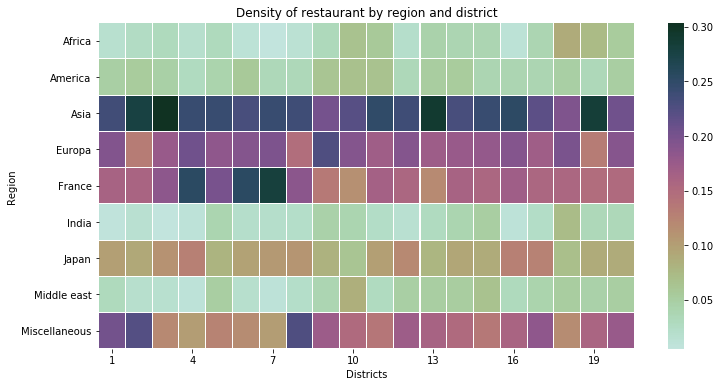

In [34]:
draw_density_of_restaurant_by_region_and_district(df_hot_region_grouped)

As we can see, the Asia category leads in a large majority of boroughs, followed by France and Europa. Then the “fast” cuisine and Japan.

That is a « regional » view, but can we group districts together according to national cuisines ?

Here appear the specialties classified by district :

### 10 first common cuisine venues by district:

In [35]:
arrd_venues_sorted_cuisine = getArrdSortedVenues(10, df_hot_cuisine_grouped)
arrd_venues_sorted_cuisine.head(20)

,Arrd,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,French,Asian,Japanese,Sandwich,Italian,SaladPlace,Chinese,FastFood,PizzaPlace,Korean
1,2,Asian,French,SaladPlace,Japanese,Sandwich,Thai,Chinese,Italian,FastFood,VegetarianVegan
2,3,French,Asian,Japanese,Chinese,Italian,VegetarianVegan,Vietnamese,Sandwich,Thai,PizzaPlace
3,4,French,Asian,Japanese,Italian,Creperie,Chinese,Spanish,Tapas,FastFood,Sandwich
4,5,French,Asian,Italian,Japanese,Creperie,Sandwich,Chinese,FastFood,Vietnamese,Greek
5,6,French,Asian,Japanese,Italian,Sandwich,Creperie,PizzaPlace,Chinese,FastFood,Seafood
6,7,French,Asian,Italian,Japanese,Chinese,Brasserie,Sandwich,Creperie,PizzaPlace,VegetarianVegan
7,8,French,Asian,Sandwich,Japanese,SaladPlace,Italian,Chinese,FastFood,Vietnamese,PizzaPlace
8,9,PizzaPlace,French,Asian,Thai,Japanese,Italian,Chinese,Sandwich,India,FastFood
9,10,Asian,French,Chinese,Turkish,PizzaPlace,FastFood,Italian,Japanese,African,India


We can see that in the 8th district, « fast » cuisine (sandwiches, salads, fastfood, pizzas are 10th) is very widespread.<br> That's a district where are located a large railway station and numerous business.

Can we retrieve these trends in a global district view ? Let's take the cuisine case clustering :

### plotting the inertia to find the optimal number of clusters for cuisine type

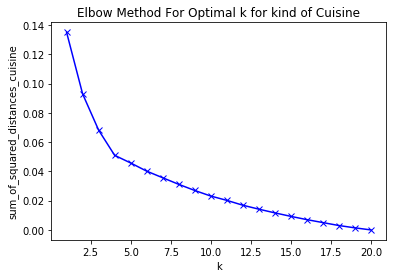

In [36]:
sum_of_squared_distances_cuisine = []
city_cuisine_grouped_clustering = df_hot_cuisine_grouped.drop('Arrd', 1)
K = range(1,21)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(city_cuisine_grouped_clustering)
    sum_of_squared_distances_cuisine.append(kmeans.inertia_)
plt.plot(K, sum_of_squared_distances_cuisine, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances_cuisine')
plt.title('Elbow Method For Optimal k for kind of Cuisine')
plt.show()

### if we take the elbow method, the best k is 4

## Clustering the venues by cuisine

In [37]:
kclusters = 4
city_merged_data_with_clusters_cuisine = mergeCityDataByClusters(kclusters, df_hot_cuisine_grouped, arrd_venues_sorted_cuisine, df_center_arrd_coordinates)
city_merged_data_with_clusters_cuisine = city_merged_data_with_clusters_cuisine.astype({'Cluster Labels': int})
city_merged_data_with_clusters_cuisine.head(20)

,Arrd,Arrd_lat,Arrd_lng,Width,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,48.862994,2.335592,2.12,3,French,Asian,Japanese,Sandwich,Italian,SaladPlace,Chinese,FastFood,PizzaPlace,Korean
1,2,48.868651,2.342876,1.93,3,Asian,French,SaladPlace,Japanese,Sandwich,Thai,Chinese,Italian,FastFood,VegetarianVegan
2,3,48.863132,2.359781,1.82,1,French,Asian,Japanese,Chinese,Italian,VegetarianVegan,Vietnamese,Sandwich,Thai,PizzaPlace
3,4,48.854801,2.358448,2.05,1,French,Asian,Japanese,Italian,Creperie,Chinese,Spanish,Tapas,FastFood,Sandwich
4,5,48.844402,2.350722,2.16,2,French,Asian,Italian,Japanese,Creperie,Sandwich,Chinese,FastFood,Vietnamese,Greek
5,6,48.849663,2.334591,2.18,1,French,Asian,Japanese,Italian,Sandwich,Creperie,PizzaPlace,Chinese,FastFood,Seafood
6,7,48.856126,2.312648,3.15,1,French,Asian,Italian,Japanese,Chinese,Brasserie,Sandwich,Creperie,PizzaPlace,VegetarianVegan
7,8,48.872641,2.312196,2.81,3,French,Asian,Sandwich,Japanese,SaladPlace,Italian,Chinese,FastFood,Vietnamese,PizzaPlace
8,9,48.877233,2.338439,2.32,0,PizzaPlace,French,Asian,Thai,Japanese,Italian,Chinese,Sandwich,India,FastFood
9,10,48.876046,2.360503,2.41,0,Asian,French,Chinese,Turkish,PizzaPlace,FastFood,Italian,Japanese,African,India


In [38]:
map_clusters_cuisine = displayMapClusters(city_merged_data_with_clusters_cuisine, 4, df_center_arrd_coordinates)
map_clusters_cuisine

## if the map doesn't appear, you can see it at:
https://github.com/datafra75/Coursera_Capstone/blob/main/cuisine_clustering_map.jpg

In [39]:
city_merged_data_with_clusters_cuisine.loc[city_merged_data_with_clusters_cuisine['Cluster Labels'] == 0, city_merged_data_with_clusters_cuisine.columns[[0] + list(range(4, city_merged_data_with_clusters_cuisine.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,9,0,PizzaPlace,French,Asian,Thai,Japanese,Italian,Chinese,Sandwich,India,FastFood
9,10,0,Asian,French,Chinese,Turkish,PizzaPlace,FastFood,Italian,Japanese,African,India
12,13,0,Vietnamese,Sandwich,Asian,Chinese,French,Italian,Japanese,Thai,FastFood,PizzaPlace
13,14,0,Chinese,PizzaPlace,Japanese,Asian,Italian,French,FastFood,Creperie,Sandwich,Vietnamese
14,15,0,FastFood,French,Japanese,Thai,Italian,Asian,PizzaPlace,India,Chinese,Creperie


In [40]:
city_merged_data_with_clusters_cuisine.loc[city_merged_data_with_clusters_cuisine['Cluster Labels'] == 1, city_merged_data_with_clusters_cuisine.columns[[0] + list(range(4, city_merged_data_with_clusters_cuisine.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,3,1,French,Asian,Japanese,Chinese,Italian,VegetarianVegan,Vietnamese,Sandwich,Thai,PizzaPlace
3,4,1,French,Asian,Japanese,Italian,Creperie,Chinese,Spanish,Tapas,FastFood,Sandwich
5,6,1,French,Asian,Japanese,Italian,Sandwich,Creperie,PizzaPlace,Chinese,FastFood,Seafood
6,7,1,French,Asian,Italian,Japanese,Chinese,Brasserie,Sandwich,Creperie,PizzaPlace,VegetarianVegan


In [41]:
city_merged_data_with_clusters_cuisine.loc[city_merged_data_with_clusters_cuisine['Cluster Labels'] == 2, city_merged_data_with_clusters_cuisine.columns[[0] + list(range(4, city_merged_data_with_clusters_cuisine.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,5,2,French,Asian,Italian,Japanese,Creperie,Sandwich,Chinese,FastFood,Vietnamese,Greek
10,11,2,Asian,French,Japanese,Chinese,FastFood,Italian,PizzaPlace,Sandwich,African,Thai
11,12,2,Asian,French,Japanese,Sandwich,FastFood,PizzaPlace,Italian,Chinese,Vietnamese,Sushi
17,18,2,Asian,French,India,African,FastFood,PizzaPlace,Italian,Japanese,Chinese,Creperie
18,19,2,Asian,French,FastFood,Chinese,Japanese,African,PizzaPlace,Vietnamese,Sandwich,Italian
19,20,2,French,Asian,FastFood,Japanese,PizzaPlace,Chinese,Italian,Sandwich,Turkish,India


In [42]:
city_merged_data_with_clusters_cuisine.loc[city_merged_data_with_clusters_cuisine['Cluster Labels'] == 3, city_merged_data_with_clusters_cuisine.columns[[0] + list(range(4, city_merged_data_with_clusters_cuisine.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,3,French,Asian,Japanese,Sandwich,Italian,SaladPlace,Chinese,FastFood,PizzaPlace,Korean
1,2,3,Asian,French,SaladPlace,Japanese,Sandwich,Thai,Chinese,Italian,FastFood,VegetarianVegan
7,8,3,French,Asian,Sandwich,Japanese,SaladPlace,Italian,Chinese,FastFood,Vietnamese,PizzaPlace
15,16,3,French,Asian,Japanese,Italian,Chinese,Sandwich,FastFood,PizzaPlace,SaladPlace,Sushi
16,17,3,Asian,French,Japanese,Italian,Sandwich,FastFood,PizzaPlace,SaladPlace,Chinese,Vietnamese


To be honest, that's not easy to interpret.<br>
Cluster 1 (districts 3, 4, 6, 7) shows a predominant part of the France category.<br>
The other three clusters show a mix between the categories France and Asia, the difference is rather in the following positions.<br>
On the other hand, with clustering at the regional level, we see much more.

### 8 first common region venues by district:

In [32]:
arrd_venues_sorted_region = getArrdSortedVenues(8, df_hot_region_grouped)
arrd_venues_sorted_region.head(20)

,Arrd,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,1,Asia,Miscellaneous,Europa,France,Japan,America,Middle east,Africa
1,2,Asia,Miscellaneous,France,Europa,Japan,America,Africa,Middle east
2,3,Asia,France,Europa,Miscellaneous,Japan,America,Africa,Middle east
3,4,France,Asia,Europa,Japan,Miscellaneous,America,Africa,Middle east
4,5,Asia,France,Europa,Miscellaneous,Japan,Middle east,America,India
5,6,France,Asia,Europa,Miscellaneous,Japan,America,India,Middle east
6,7,France,Asia,Europa,Japan,Miscellaneous,America,India,Middle east
7,8,Asia,Miscellaneous,France,Europa,Japan,America,Middle east,India
8,9,Europa,Asia,Miscellaneous,France,Japan,America,India,Middle east
9,10,Asia,Europa,Miscellaneous,France,Middle east,America,Africa,Japan


## Clustering the venues by region

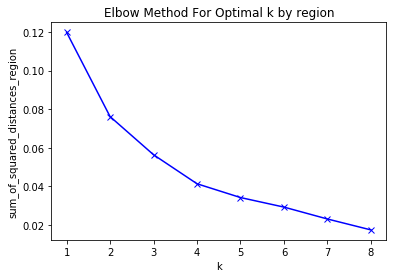

In [89]:
sum_of_squared_distances_region = []
city_region_grouped_clustering = df_hot_region_grouped.drop('Arrd', 1)
K = range(1,9)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(city_region_grouped_clustering)
    sum_of_squared_distances_region.append(kmeans.inertia_)
plt.plot(K, sum_of_squared_distances_region, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances_region')
plt.title('Elbow Method For Optimal k by region')
plt.show()

The elbow method suggests that we again choose 4 clusters. And indeed, we're going to see that these 4 clusters can be interestingly interpretated. Here's what it renders using Folium.

In [95]:
map_clusters_region = displayMapClusters(city_merged_data_with_clusters_region, 4, df_center_arrd_coordinates)
map_clusters_region

## if the map doesn't appear, you can see it at:
https://github.com/datafra75/Coursera_Capstone/blob/main/region_clustering_map.jpg

We can see the following clusters :
- cluster 0 : districts 1, 2, 8, 12, 16, 17 (red)
- cluster 1 : districts 3, 5, 11, 13, 14, 15, 19 (violet)
- cluster 2 : districts 9, 10, 18, 20 (turquoise)
- cluster 3 : districts 4, 6, 7 (mustard yellow... ?)

In [93]:
kclusters = 4
city_merged_data_with_clusters_region = mergeCityDataByClusters(kclusters, df_hot_region_grouped, arrd_venues_sorted_region, df_center_arrd_coordinates)
city_merged_data_with_clusters_region = city_merged_data_with_clusters_region.astype({'Cluster Labels': int})
city_merged_data_with_clusters_region.head(20)

,Arrd,Arrd_lat,Arrd_lng,Width,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,1,48.862994,2.335592,2.12,0,Asia,Miscellaneous,Europa,France,Japan,America,Middle east,Africa
1,2,48.868651,2.342876,1.93,0,Asia,Miscellaneous,France,Europa,Japan,America,Africa,Middle east
2,3,48.863132,2.359781,1.82,1,Asia,France,Europa,Miscellaneous,Japan,America,Africa,Middle east
3,4,48.854801,2.358448,2.05,3,France,Asia,Europa,Japan,Miscellaneous,America,Africa,Middle east
4,5,48.844402,2.350722,2.16,1,Asia,France,Europa,Miscellaneous,Japan,Middle east,America,India
5,6,48.849663,2.334591,2.18,3,France,Asia,Europa,Miscellaneous,Japan,America,India,Middle east
6,7,48.856126,2.312648,3.15,3,France,Asia,Europa,Japan,Miscellaneous,America,India,Middle east
7,8,48.872641,2.312196,2.81,0,Asia,Miscellaneous,France,Europa,Japan,America,Middle east,India
8,9,48.877233,2.338439,2.32,2,Europa,Asia,Miscellaneous,France,Japan,America,India,Middle east
9,10,48.876046,2.360503,2.41,2,Asia,Europa,Miscellaneous,France,Middle east,America,Africa,Japan


In [96]:
city_merged_data_with_clusters_region.loc[city_merged_data_with_clusters_region['Cluster Labels'] == 0, city_merged_data_with_clusters_region.columns[[0] + list(range(4, city_merged_data_with_clusters_region.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,1,0,Asia,Miscellaneous,Europa,France,Japan,America,Middle east,Africa
1,2,0,Asia,Miscellaneous,France,Europa,Japan,America,Africa,Middle east
7,8,0,Asia,Miscellaneous,France,Europa,Japan,America,Middle east,India
11,12,0,Asia,Europa,Miscellaneous,France,Japan,Middle east,America,Africa
15,16,0,Asia,Europa,France,Miscellaneous,Japan,America,Middle east,Africa
16,17,0,Asia,Miscellaneous,Europa,France,Japan,Middle east,America,Africa


In [97]:
city_merged_data_with_clusters_region.loc[city_merged_data_with_clusters_region['Cluster Labels'] == 1, city_merged_data_with_clusters_region.columns[[0] + list(range(4, city_merged_data_with_clusters_region.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
2,3,1,Asia,France,Europa,Miscellaneous,Japan,America,Africa,Middle east
4,5,1,Asia,France,Europa,Miscellaneous,Japan,Middle east,America,India
10,11,1,Asia,Europa,France,Miscellaneous,Japan,America,Africa,Middle east
12,13,1,Asia,Europa,Miscellaneous,France,Japan,America,Middle east,Africa
13,14,1,Asia,Europa,France,Miscellaneous,Japan,America,Middle east,India
14,15,1,Asia,Europa,France,Miscellaneous,Japan,Middle east,India,America
18,19,1,Asia,Miscellaneous,France,Europa,Japan,Africa,Middle east,India


In [98]:
city_merged_data_with_clusters_region.loc[city_merged_data_with_clusters_region['Cluster Labels'] == 2, city_merged_data_with_clusters_region.columns[[0] + list(range(4, city_merged_data_with_clusters_region.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
8,9,2,Europa,Asia,Miscellaneous,France,Japan,America,India,Middle east
9,10,2,Asia,Europa,Miscellaneous,France,Middle east,America,Africa,Japan
17,18,2,Europa,Asia,France,Miscellaneous,Africa,India,Japan,Middle east
19,20,2,Asia,Europa,Miscellaneous,France,Japan,Africa,America,Middle east


In [99]:
city_merged_data_with_clusters_region.loc[city_merged_data_with_clusters_region['Cluster Labels'] == 3, city_merged_data_with_clusters_region.columns[[0] + list(range(4, city_merged_data_with_clusters_region.shape[1]))]][:10]

,Arrd,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
3,4,3,France,Asia,Europa,Japan,Miscellaneous,America,Africa,Middle east
5,6,3,France,Asia,Europa,Miscellaneous,Japan,America,India,Middle east
6,7,3,France,Asia,Europa,Japan,Miscellaneous,America,India,Middle east


- The third cluster brings together all the neighbors where France comes fisrt, then Asia and Europa.
- In cluster 2, Asia and Europa are trusting the two first places, the third one being assigned to fast cuisine.
- In clusters 0 and 1, Asia comes first, and the distinction lies in the next positions.
- In cluster 0, the category Miscellaneous mainly before France and Europa, whereas in cluster 1, it's the contrary, France and Europa are before Miscellaneous.

## 3.3 Exploratory Data Analysis, third step <a name="thirdstep"></a>

Now that the restaurateur has a good overview of the distribution of restaurants by district and « region », he can choose a district and try to find a good spot.

Data is good, but maps are better for visualizing. So I calculated for all the restaurants of Paris, a number, called « density » which accounts for the number of other restaurants located in a given circle around the restaurant. I chose a radius of 200
meters. To visualize the density of restaurants throughout the districts, district by district I kept the highest density and created a scale of colors from green to red. The greenest the most isolated, the reddest the less isolated.

In [43]:
displayMapDensityParis(df_all_venues, 200)

## if the map doesn't appear, you can see it at:
https://github.com/datafra75/Coursera_Capstone/blob/main/Paris.jpg

### For our case study, we can choose the opening of an Indian restaurant in the 16th district where the density of restaurant is low as well as the proportion of Indian ones.

In [44]:
displayMapDensityByDistrictByCuisine(df_all_venues, 16, "", df_center_arrd_coordinates, 200, 14)

## if the map doesn't appear, you can see it at:
https://github.com/datafra75/Coursera_Capstone/blob/main/density_16.jpg

On this map, we clearly see where are the points of higher density. But we've here all the restaurants. What about Indian ones ?

To visualize the positions of the Indian restaurants, as we can see it on the map below, I overlaid two ranges of points.<br>
Pale yellow to bright yellow to show the density of restaurants that are not Indian, and from green to red for the Indian restaurants already present. As there are only 5 Indian restaurants quite distant from each other, they all appear in green.

In [45]:
displayMapDensityByDistrictDistinguishingCuisine(df_all_venues, 16, 'India', df_center_arrd_coordinates, 200, 14)

## if the map doesn't appear, you can see it at:
https://github.com/datafra75/Coursera_Capstone/blob/main/paris16.jpg

The owner has now a tool to decide where to set up his new restaurant.

## 4. Results, difficulties, discussion and possible improvements <a name="results"></a>

- Paris is a big city with a lot of restaurants. The method made it possible to get an idea of ​​the distribution and density of restaurants of all nationalities across all districts. 
- Due to the large number of requests, I have limited the number of categories to 69. Normally, all categories should be used. Likewise, one should check what « general » categories like Asia or Japan are accounting for because some Japanese restaurants were in both national category as well as in Asia but others were not in Asia.
- Foursquare using circles to bring back the venues, it is difficult to be exhaustive in the network of districts. This can be awkward when the density of restaurants is high at the crossroads of districts. It would necessary to increase the number of requests.
- Despite this, the method made it possible to correctly define the distribution of restaurants and their density. The clustering highlighted a number of constants in the distribution of cuisines and regions across the districts.   
- Thus the « fast cuisine » cluster (number 0) brings together neighborhoods where people do not have much time to eat lunch because they have a train to catch or because they work in places where there are a lot of offices and a lot of queues.
- The cluster 3 brings together neighborhoods that have a fairly old historical and gastronomic tradition (marais, Saint-Germain-des-Près, Invalides, Tour Eiffel) where many French restaurants are located.
- Asia trusts most of the first place ; It would be even more the case in adding inside the categories Japan and India. 
- The owner therefore chose the 16th district and we saw that locating the restaurants as well as their density, and separating the India category from the others, allowed him to choose the right location corresponding to the strategy he had chosen. But the method would also allow him to respond to any other strategy.


## 5. Conclusion <a name="conclusion"></a>

This method allows any restaurateur to analyze the distribution of restaurants and culinary trends by district (density) but also across districts (clustering) in Paris. And it is also valid in any city for an owner coming from another continent for the choice of the city. It is also valid for any other category of venues.<br>
For example, if a person wanted to live in an area where there is a lot of nightlife, or where there are a lot of services, or even on the contrary a peaceful area with few shops. Everything is possible.<br>
Well, of course, this is only the data part of location, density, distribution of the different categories. The future restaurateur must also do a market study depending on the location chosen to see if his business will be viable (local taxes, popularity of restaurants in the neighborhood, level of tourism and so on).


## 6. References <a name="references"></a>

- [1] Foursquare : https://developer.foursquare.com/developer/
- [2] Folium : https://pypi.org/project/folium/
- [3] Venues categories : https://developer.foursquare.com/docs/build-withfoursquare/categories
- [4] Coordonates of Paris : https://latitude.to/map/fr/france/cities/paris
- [5] Google Map : https://www.google.com/maps/place/Paris

# CODE:  <a name="code"></a>

In [6]:
def displayMapClusters(_city_merged_data_with_clusters, _kclusters, _df_arrd_coordinates):
    '''
    _city_merged_data_with_clusters # all the data to be clustered
    _kclusters # number of clusters
    _df_arrd_coordinates # city districts data
    Display the map with all the clusters pointed by a color
    '''
    # centering on one neighborhood
    latitude = _df_arrd_coordinates.loc[0, 'Arrd_lat']
    longitude =  _df_arrd_coordinates.loc[0, 'Arrd_lng']
    # create map
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

    # set color scheme for the clusters
    # Matplotlib and associated plotting modules
    import matplotlib.cm as cm
    import matplotlib.colors as colors
    x = np.arange(_kclusters)
    ys = [i + x + (i*x)**2 for i in range(_kclusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, cluster in zip(_city_merged_data_with_clusters['Arrd_lat'], _city_merged_data_with_clusters['Arrd_lng'], _city_merged_data_with_clusters['Arrd'], _city_merged_data_with_clusters['Cluster Labels']):
        label = folium.Popup('Arrd :' + str(poi) + ', Cluster: ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_clusters)
    return map_clusters

In [7]:
def get_all_venues_by_district(_df_arrd_coordinates, _df_categories, _num_arrd):
    '''
    _df_arrd_coordinates # 
    _df_categories
    _num_arrd
    return: all the venues of a district
    '''
    global count_requests
    df_all_venues_arrd = pd.DataFrame(columns=['Arrd', 'Arrd_lat', 'Arrd_lng', 'Venue', 'Venue lat', 'Venue lng', 'Category region', 'Cuisine'])

    # district number num_arrd
    df_arrd = _df_arrd_coordinates[_df_arrd_coordinates.Arrd == _num_arrd].loc[:, ['Arrd_lat', 'Arrd_lng', 'rad']]
    df_arrd = df_arrd.reset_index(drop=True)
    # from 1 to 3 requests by district
    for j in range(df_arrd.shape[0]):
        arrd_lat = df_arrd.iloc[j,0]
        arrd_lng = df_arrd.iloc[j,1]
        rad = df_arrd.iloc[j,2]
        # 69 categories
        for num_categ in range(_df_categories.shape[0]): #_df_categories.shape[0] range(2)
            categ_id = _df_categories.iloc[num_categ, 1]
            region = _df_categories.iloc[num_categ, 0]
            cuisine = _df_categories.iloc[num_categ, 2]
            url_city = getQueryUrl(CLIENT_ID, CLIENT_SECRET, VERSION, arrd_lat, arrd_lng, categ_id, rad)
            results_city = requests.get(url_city).json()
            count_requests = count_requests + 1
            venues = results_city['response']['venues']
            if len(venues) > 0:
                nearby_venues = json_normalize(venues) # flatten JSON
                # filter columns
                filtered_columns = ['name', 'location.lat', 'location.lng']
                nearby_venues = nearby_venues.loc[:, filtered_columns]
                nearby_venues.columns = ['Venue', 'Venue lat', 'Venue lng']
                nearby_venues['Arrd'] = _num_arrd
                nearby_venues['Arrd_lat'] = arrd_lat
                nearby_venues['Arrd_lng'] = arrd_lng
                nearby_venues['Category region'] = region
                nearby_venues['Cuisine'] = cuisine
                nearby_venues.columns = ['Venue', 'Venue lat', 'Venue lng', 'Arrd', 'Arrd_lat', 'Arrd_lng', 'Category region', 'Cuisine']
                df_all_venues_arrd = df_all_venues_arrd.append(nearby_venues, ignore_index=True)
    return df_all_venues_arrd

In [8]:
def getQueryUrl(_CLIENT_ID, _CLIENT_SECRET, _VERSION, _latitude, _longitude, _categoryId, _radius):
    '''
    _CLIENT_ID # client ID to use foursquare
    _CLIENT_SECRET # client secret ID to use foursquare
    _VERSION # the version of foursquare
    _latitude # the latitude of the center of the exploring
    _longitude # the longitude of the center of the exploring
    _categoryId # category Id of venues in Foursquare
    _radius # radius of the area around the coordinates to look for venues
    '''
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}'.format(
        _CLIENT_ID, 
        _CLIENT_SECRET, 
        _VERSION, 
        _latitude, 
        _longitude,
        _categoryId,
        _radius)
    return url

In [9]:
def grouping_cuisine_data(_df_all_venues):
    '''
    _df_all_venues # data for all the venues
    '''
    venues_onehot = pd.get_dummies(_df_all_venues[['Cuisine']], prefix="", prefix_sep="")
    venues_onehot['Arrd'] = _df_all_venues['Arrd']
    df_hot_grouped = venues_onehot.groupby('Arrd').mean().reset_index()
    return df_hot_grouped
def grouping_Region_data(_df_all_venues):
    '''
    _df_all_venues # data for all the venues
    '''
    venues_onehot = pd.get_dummies(_df_all_venues[['Category region']], prefix="", prefix_sep="")
    venues_onehot['Arrd'] = _df_all_venues['Arrd']
    df_hot_grouped = venues_onehot.groupby('Arrd').mean().reset_index()
    return df_hot_grouped
def displayTopVenuesInNeighborhood(_num_top_venues, _grouped, _n_display):
    '''
    _num_top_venues # number of top venues to display by district
    _grouped # city raw grouped data
    _n_display # number of district to display
    '''
    for i, hood in enumerate(_grouped['Arrd']):
        if (i <_n_display):
            print("----"+str(hood)+"----")
            temp = _grouped[_grouped['Arrd'] == hood].T.reset_index()
            temp.columns = ['venue','freq']
            temp = temp.iloc[1:]
            temp['freq'] = temp['freq'].astype(float)
            temp = temp.round({'freq': 2})
            print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(_num_top_venues))
            print('\n')

In [10]:
def returnMostCommonVenues(_row, _num_top_venues):
    '''
    _row # line of data
    _num_top_venues # number of top venues to display
    '''
    row_categories = _row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:_num_top_venues]

def getArrdSortedVenues(_num_top_venues, _grouped):
    '''
    _num_top_venues # number of top venues to display
    _grouped # city raw grouped data
    '''
    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['Arrd']
    for ind in np.arange(_num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))

    # create a new dataframe
    arrd_venues_sorted = pd.DataFrame(columns=columns)
    arrd_venues_sorted['Arrd'] = _grouped['Arrd']

    for ind in np.arange(_grouped.shape[0]):
        arrd_venues_sorted.iloc[ind, 1:] = returnMostCommonVenues(_grouped.iloc[ind, :], _num_top_venues)
    
    return arrd_venues_sorted

In [11]:
def mergeCityDataByClusters(_kclusters, _grouped, _arrd_venues_sorted, _df_center_arrd_coordinates):
    '''
    _kclusters # nomber of clusters
    _grouped # city raw grouped data
    _arrd_venues_sorted # sorted venues
    _df_center_arrd_coordinates # coordonates of the center of the districts
    return: a dataframe with included the number of the cluster for each district
    '''
    city_grouped_clustering = _grouped.drop('Arrd', 1)

    # run k-means clustering
    kmeans = KMeans(n_clusters=_kclusters, random_state=0).fit(city_grouped_clustering)
    # add clustering labels
    new_arrd_venues_sorted = _arrd_venues_sorted.copy()
    new_arrd_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
    city_merged = _df_center_arrd_coordinates.copy()
    # merge city_merged with _df_arrd_coordinates to add latitude/longitude for each neighborhood
    city_merged = city_merged.join(new_arrd_venues_sorted.set_index('Arrd'), on='Arrd')

    return city_merged
def haversine(_lat1, _lng1, _lat2, _lng2):
    '''
    _lat1 # latitude of the fist point
    _lng1 # longitude of the fist point
    _lat2 # latitude of the second point
    _lng2 # longitude of the second point
    return : the distance between the two points whose latitude and longitude are passed as parameters 
    '''
    global degree_to_rad
    d_lat = (_lat2 - _lat1) * degree_to_rad
    d_lng = (_lng2 - _lng1) * degree_to_rad
    a = pow(sin(d_lat / 2), 2) + cos(_lat1 * degree_to_rad) * cos(_lat2 * degree_to_rad) * pow(sin(d_lng / 2), 2)
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    km = 6367 * c
    return km
def get_distance_array(_size, _df_all_venues_part):
    '''
    _size # number of venues
    _df_all_venues_part # a part of all the venues, for example venues of a district
    return: the array of distances between the venues of a district
    '''
    d = np.zeros((_size,_size))
    for i in range(_size):
        for j in range(i+1,_size):
            d[i,j] = 1000*haversine(_df_all_venues_part.iloc[i, 4], _df_all_venues_part.iloc[i, 5], _df_all_venues_part.iloc[j, 4], _df_all_venues_part.iloc[j, 5])
            d[j,i] = d[i,j]
    return d
def get_density(_size, _distance_array, _dist=500):
    '''
    _size # number of venues
    _distance_array # array of the distances between venues
    _dist # the distance max to look for venues
    return: the density for an array of distances
    '''
    pop = np.zeros((_size))
    for i in range(_size):
        n = 0
        for j in range(_size):
            if j !=i and _distance_array[i,j] <= _dist:
                n += 1
        pop[i] = n
    return pop
def get_rainbow_green_red(_size):
    '''
    _size # maximum of density, top of the color spectrum
    return: the color spectrum from green to red
    '''
    colors_array = []
    if _size > 0:
        for i in range(1+_size):
            colors_array.append(((i/_size, 1-i/_size, 0.0)))
    else:
        colors_array.append(((0, 1, 0)))
    return [colors.rgb2hex(i) for i in colors_array]
def get_rainbow_yellow(_size):
    '''
    _size # maximum of density, top of the color spectrum
    return: the color spectrum for yellow
    '''    
    colors_array = []
    
    if _size > 0:
        for i in range(1+_size):
            colors_array.append(((1, 1, 0.90*(1-i/_size))))
    else:
        colors_array.append(((1, 1, 0.9)))
    return [colors.rgb2hex(i) for i in colors_array]

In [12]:
def displayMapDensityByDistrictByCuisine(_df_all_venues, _num_district, _cuisine, _df_center_arrd_coordinates, _radius, _zoom):
    '''
    _df_all_venues # data for all the venues
    _num_district # number of the district
    _df_center_arrd_coordinates # coordonates of the center of the districts
    _radius # radius of 
    _zoom # initial zoom for displaying the map
    Display the density map for a district or a district and a cuisine
    '''
    
    if _cuisine == "":
        df_all_venues_part = _df_all_venues[_df_all_venues['Arrd'] == _num_district]
    else:
        df_all_venues_part = _df_all_venues[(_df_all_venues['Arrd'] == _num_district) & (_df_all_venues['Cuisine'] == _cuisine)]
        
    pop = get_density_of_venues(df_all_venues_part, _radius)
    rainbow = get_rainbow_green_red(np.max(pop))
    df_all_venues_part['density'] = pop    
    
    # create map
    map_density = folium.Map(location=[_df_center_arrd_coordinates.iloc[_num_district-1, 1], _df_center_arrd_coordinates.iloc[_num_district-1, 2]], zoom_start=_zoom)
  
    # add markers to the map
    map_density = add_markers_to_the_map(map_density, df_all_venues_part, rainbow)

    return map_density

In [13]:
def displayMapDensityParis(_df_all_venues, _radius):
    '''
    _df_all_venues # data for all the venues
    _radius # the radius for the density calculation
    Display the restaurant density all over Paris
    '''
    # create map
    map_density = folium.Map(location=[48.863303, 2.342317], zoom_start=13)
    
    for num_district in range(1, 21):
        df_all_venues_part = df_all_venues[df_all_venues['Arrd'] == num_district]
        pop = get_density_of_venues(df_all_venues_part, _radius)
        rainbow = get_rainbow_green_red(max(pop))
        df_all_venues_part['density'] = pop    

        # add markers to the map
        map_density = add_markers_to_the_map(map_density, df_all_venues_part, rainbow)

    return map_density

In [14]:
def displayMapDensityByDistrictDistinguishingCuisine(_df_all_venues, _num_district, _cuisine, _df_center_arrd_coordinates, _radius, _zoom):
    '''
    _df_all_venues # data for all the venues
    _num_district # number of the district
    _cuisine # the cuisine we want to highlight on the map
    _df_center_arrd_coordinates # coordonates of the center of the districts
    _radius # the radius of the circle in wich to look for restaurants
    _zoom # initial zoom for displaying the map
    display the map of a district with the restaurants of the _cuisine category spotted from green to red and the other restaurants from pale to bright yellow
    '''

    # create map
    map_density = folium.Map(location=[_df_center_arrd_coordinates.iloc[_num_district-1, 1], _df_center_arrd_coordinates.iloc[_num_district-1, 2]], zoom_start=_zoom)
  
    df_all_venues_part_wo_cuisine = _df_all_venues[(_df_all_venues['Arrd'] == _num_district) & (_df_all_venues['Cuisine'] != _cuisine)]
        
    pop_wo_cuisine = get_density_of_venues(df_all_venues_part_wo_cuisine, _radius)
    rainbow_yellow = get_rainbow_yellow(np.max(pop_wo_cuisine))
    df_all_venues_part_wo_cuisine['density'] = pop_wo_cuisine    
    
    # add yellow markers to the map
    map_density = add_markers_to_the_map(map_density, df_all_venues_part_wo_cuisine, rainbow_yellow)
        
    df_all_venues_part_cuisine = _df_all_venues[(_df_all_venues['Arrd'] == _num_district) & (_df_all_venues['Cuisine'] == _cuisine)]
        
    pop_cuisine = get_density_of_venues(df_all_venues_part_cuisine, _radius)
    rainbow_green_red = get_rainbow_green_red(np.max(pop_cuisine))
    df_all_venues_part_cuisine['density'] = pop_cuisine    
    
    # add green and red markers to the map
    map_density = add_markers_to_the_map(map_density, df_all_venues_part_cuisine, rainbow_green_red)
              
    return map_density

In [15]:
def add_markers_to_the_map(_map_density, _df_all_venues_part, _rainbow):
    '''
    _map_density # the density map on which to draw the circles 
    _df_all_venues_part # data for the part of the venues
    _rainbow  # the array of colors
    return: the map of density with circles added
    '''
    for lat, lng, nam, den in zip(_df_all_venues_part['Venue lat'], _df_all_venues_part['Venue lng'], _df_all_venues_part['Venue'], _df_all_venues_part['density']):
        label = folium.Popup('Name :' + nam + ', density: ' + str(den), parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color=_rainbow[den],
            fill=True,
            fill_color=_rainbow[den],
            fill_opacity=0.7).add_to(_map_density)
    return _map_density   
def get_density_of_venues(_df_all_venues_part, _radius):
    '''
    _df_all_venues_part # data for the part of the venues
    _radius # the radius of the circle in wich to look for restaurants
    '''
    _df_all_venues_part.dropna(axis=0, inplace=True)
    size = _df_all_venues_part.shape[0]
    distance_array = get_distance_array(size, _df_all_venues_part)
    pop = get_density(size, distance_array, _radius)
    pop = [int(p) for p in pop]
    return pop

In [16]:
def get_dist(_row, _c_lat, _c_lng):
    '''
    _row # data row with the latitude and longitude of a venue
    _c_lat # latitude of another point 
    _c_lng # longitude of another point
    return : distance between two points in km one of which is in a dataframe row, the second in the parameters
    '''
    return haversine(_row[4], _row[5], _c_lat, _c_lng)
def get_average_distance_and_density(_df_all_venues, _df_center_arrd_coordinates):
    '''
    _df_all_venues # data for all the venues
    _df_center_arrd_coordinates # coordonates of the center of the districts
    return : the dataframe of the average distance and the density for each district
    '''
    # average distance from a restaurant to the center of the district he belongs to
    list_average_distance = []
    for i in range(1,21):
        c_lat, c_lng = _df_center_arrd_coordinates.iloc[i-1, 1:3]
        df_all_venues_district = _df_all_venues[_df_all_venues['Arrd'] == i]
        df_all_venues_district['dist'] = df_all_venues_district.apply(get_dist, axis=1, args=(c_lat, c_lng))
        district_distance_district_mean = df_all_venues_district['dist'].mean()
        list_average_distance.append(district_distance_district_mean)
    df_average_distance = pd.DataFrame({'Arrd': list(range(1, 21)), 'Average_distance': list_average_distance})
    # district areas
    Paris_district_areas = BeautifulSoup(urlopen("https://fr.wikipedia.org/wiki/Arrondissements_de_Paris"), 'html.parser')
    df_list_districts = pd.read_html(Paris_district_areas.find(class_='wikitable sortable alternance').prettify())[0]
    list_areas = (df_list_districts['Superficie  (ha)'])['Superficie  (ha)'].to_list()[:20]
    list_areas = [int(a) for a in list_areas]
    # densities
    df_average_distance_and_density = pd.DataFrame({'Arrd': list(range(1, 21)), 'Average_distance': list_average_distance, 'Area': list_areas})
    df_average_distance_and_density['Density'] = 1000*df_average_distance_and_density['Average_distance']/df_average_distance_and_density['Area']
    return df_average_distance_and_density 

In [17]:
def draw_density_of_restaurant_by_region_and_district(_df_hot_region_grouped):
    '''
    _df_hot_region_grouped # region data grouped by districts
    '''
    # regions
    regions = ['Africa', 'America', 'Asia', 'Europa', 'France', 'India', 'Japan', 'Middle east', 'Miscellaneous']
    all_regions = 20 * regions
    # arrds
    all_arrds = []
    for i in range(1,21):
        all_arrds = all_arrds + list(i*np.ones(9, int))
    all_cat = []
    # categories
    for i in range(20): # arrds
        for j in range(1,10): # regions
            all_cat.append(_df_hot_region_grouped.iloc[i,j])
    df_hot_region_grouped_pivot = pd.DataFrame({'Arrd': all_arrds, 'Regions': all_regions, 'Categ': all_cat})
    pt = df_hot_region_grouped_pivot.pivot(index = 'Regions', columns = 'Arrd', values = 'Categ')
    f, ax = plt.subplots(figsize = (12, 6))
    cmap = sns.cubehelix_palette(start = 1.5, rot = 1.5, as_cmap = True)
    sns.heatmap(pt, xticklabels = 3, cmap = cmap, linewidths = 0.05, ax = ax)
    ax.set_title(u"Density of restaurant by region and district")
    ax.set_xlabel(u"Districts")
    ax.set_ylabel(u"Region")